In [39]:
import sys
sys.path.append('/Users/ozdil/Desktop/GIT/NeuroMechFy1x/df3dPostProcessing')
from df3dPostProcessing import df3dPostProcess
import matplotlib.pyplot as plt
import pickle
import numpy as np

In [3]:
experiment_path = '/Users/ozdil/Desktop/GIT/Drosophila/NeuroMechFly/NeuroMechFly/pose_result__home_nely_Desktop_animationSimfly_video2_180921_aDN_PR_Fly8_005_SG1_behData_images_images.pkl'

In [4]:
df3d = df3dPostProcess(experiment_path)
align = df3d.align_to_template(interpolate=True, smoothing=True)
angles = df3d.calculate_leg_angles(save_angles=False)

In [105]:
path = '/Users/ozdil/Desktop/GIT/NeuroMechFy1x/NeuroMechFly/scripts/KM/clawtrack_03.pkl'
with open(path,'rb') as f:
    claw_track_03 = pickle.load(f)

In [53]:
ct.shape[0]

7000

In [106]:
claw_dict_03 = {leg: list() for leg in legs}
legs = ['LF', 'LM', 'LH', 'RF', 'RM', 'RH']
for i_l,leg in enumerate(legs):
    claw_dict_03[leg] = np.array(claw_track_03[leg])

In [3]:
from SALib.sample import saltelli
from SALib.analyze import sobol
from SALib.test_functions import Ishigami
import numpy as np

problem = {
    'num_vars': 2,
    'names': ['kp', 'kv'],
    'bounds': [[0, 1],
               [0, 1]]
               }
param_values = saltelli.sample(problem, 7000)

print(param_values)
np.savetxt("param_values.txt", param_values)

[[0.21972656 0.09667969]
 [0.51855469 0.09667969]
 [0.21972656 0.67675781]
 ...
 [0.01965332 0.62121582]
 [0.09924316 0.73254395]
 [0.09924316 0.62121582]]


NameError: name 'np' is not defined

0.8746672073102729 0.8754915273289298


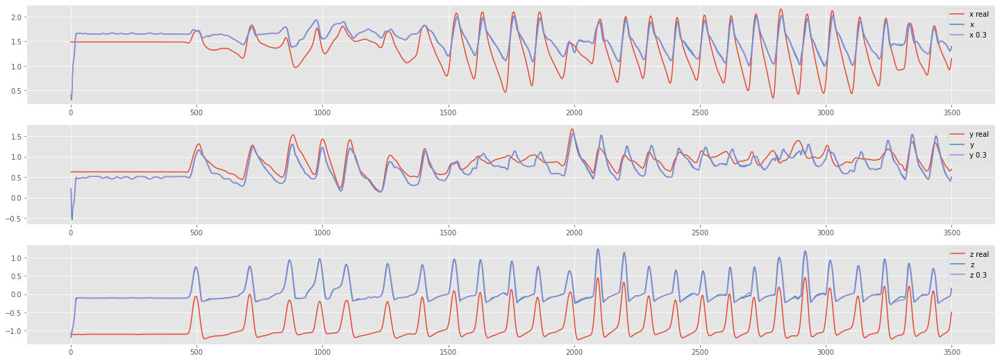

In [120]:
fig, axs = plt.subplots(3,1, figsize=(25,9))
beg = 0
end = 3500
leg = 'LF'
axs[0].plot(align[leg + '_leg']['Claw']['raw_pos_aligned'][beg+1000:end+1000, 0] , label='x real')
axs[0].plot(claw_dict[leg][beg:end,0] , label='x')
axs[0].plot(claw_dict_03[leg][beg:end,0] , label='x 0.3')
axs[0].legend()

axs[1].plot(align[leg+'_leg']['Claw']['raw_pos_aligned'][beg+1000:end+1000, 1] , label='y real')
axs[1].plot(claw_dict[leg][beg:end,1] , label='y')
axs[1].plot(claw_dict_03[leg][beg:end,1] , label='y 0.3')
axs[1].legend()

axs[2].plot(align[leg+ '_leg']['Claw']['raw_pos_aligned'][beg+1000:end+1000, 2] , label='z real')
axs[2].plot(claw_dict[leg][beg:end,2]-11.2 , label='z')
axs[2].plot(claw_dict_03[leg][beg:end,2]-11.2 , label='z 0.3')
axs[2].legend()

from sklearn.metrics import mean_squared_error
mse1 = mean_squared_error(align[leg+ '_leg']['Claw']['raw_pos_aligned'][1000:8000,2],claw_dict[leg][:,2]-11.2 )
mse2 = mean_squared_error(align[leg+ '_leg']['Claw']['raw_pos_aligned'][1000:8000,2],claw_dict_03[leg][:,2]-11.2 )
print(mse1, mse2)

In [5]:
path = '/Users/ozdil/Desktop/GIT/NeuroMechFly/scripts/SensitivityAnalysis/Walking_CartesianSpaceProcessedJointAngles.pkl'
with open(path,'rb') as f:
    angles_old = pickle.load(f)

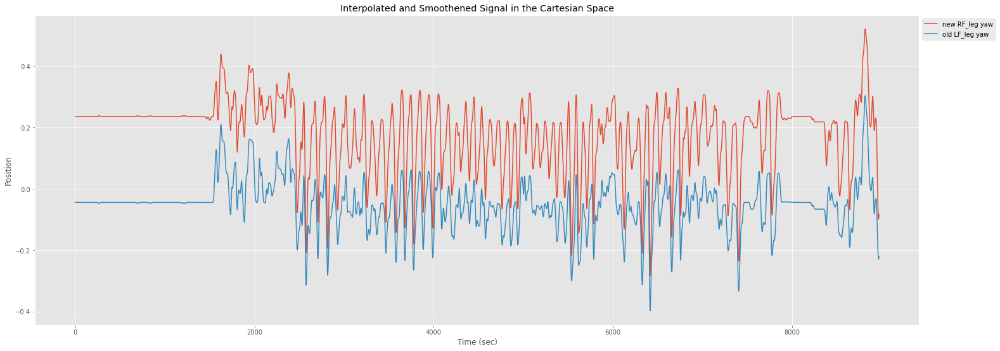

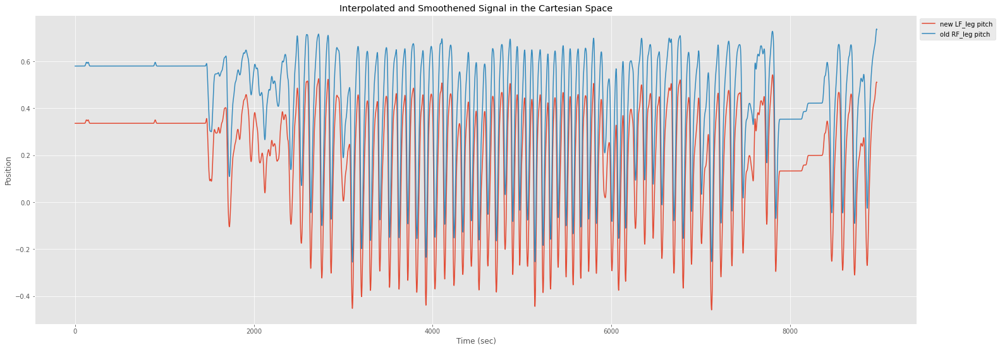

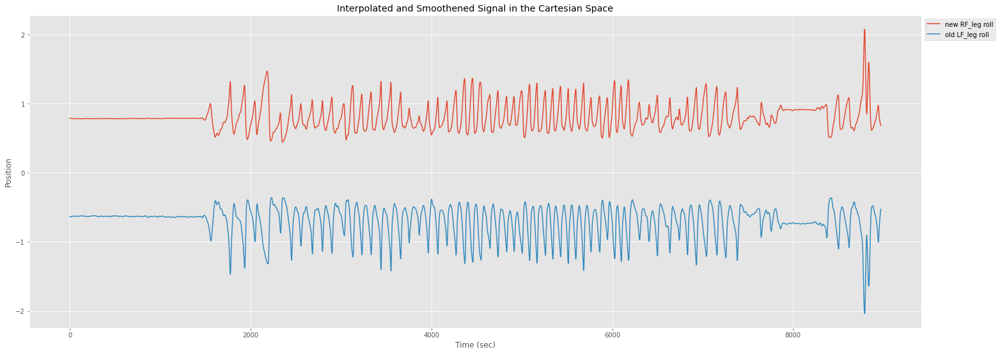

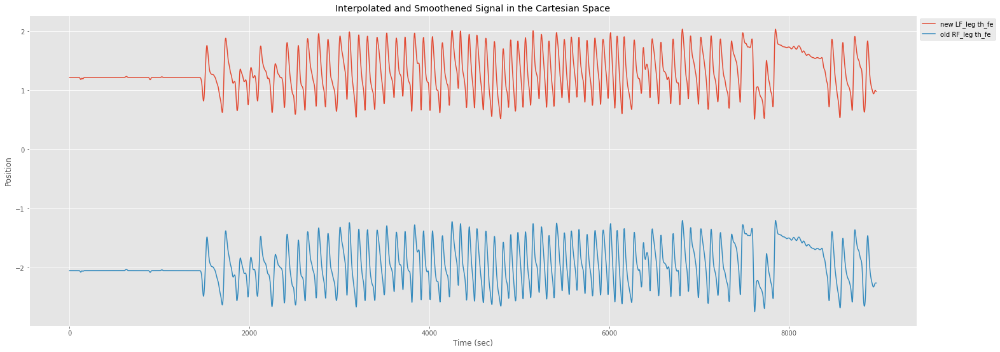

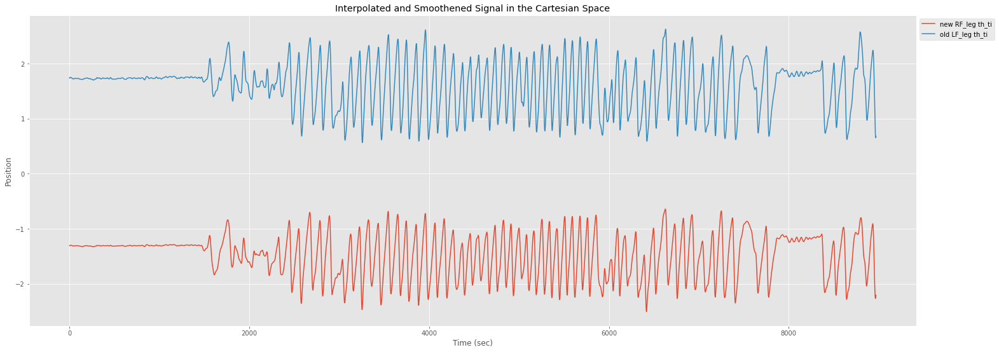

...

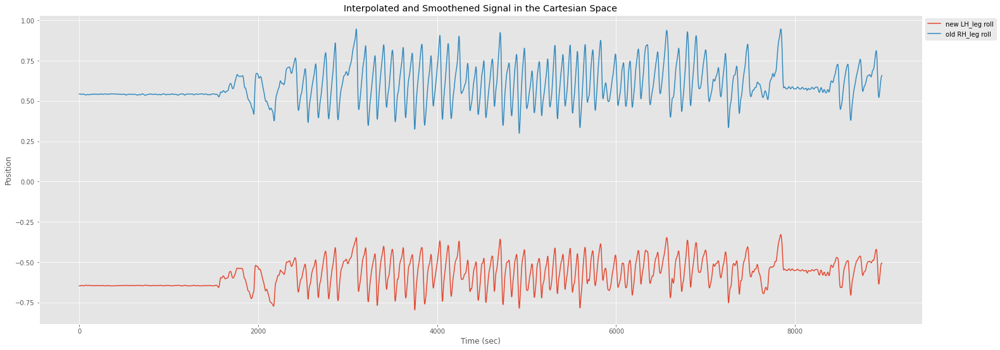

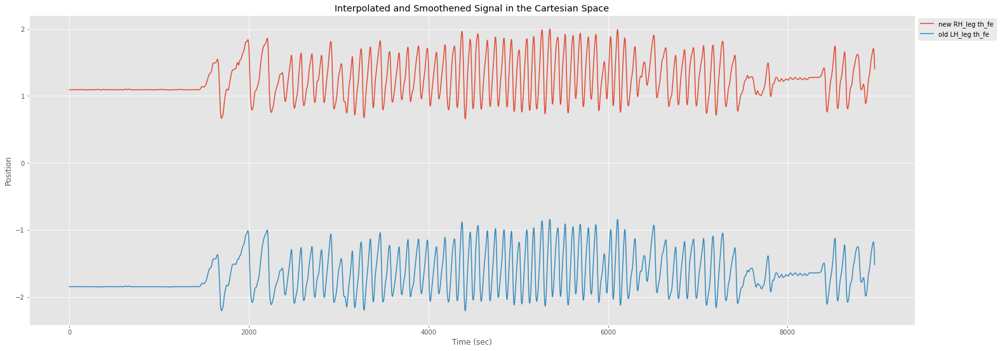

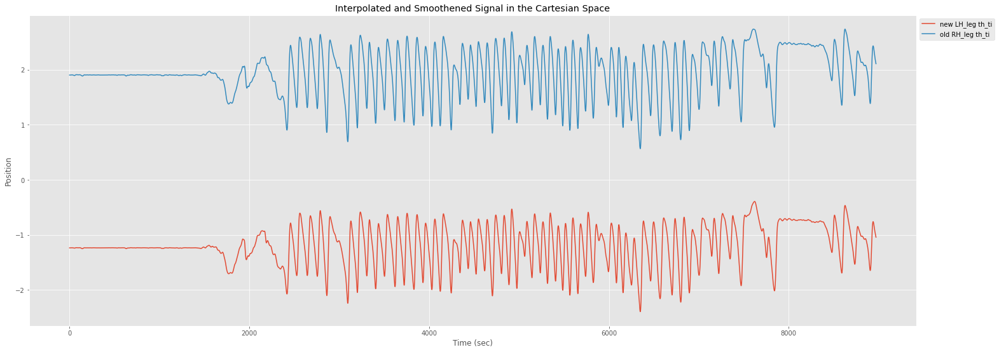

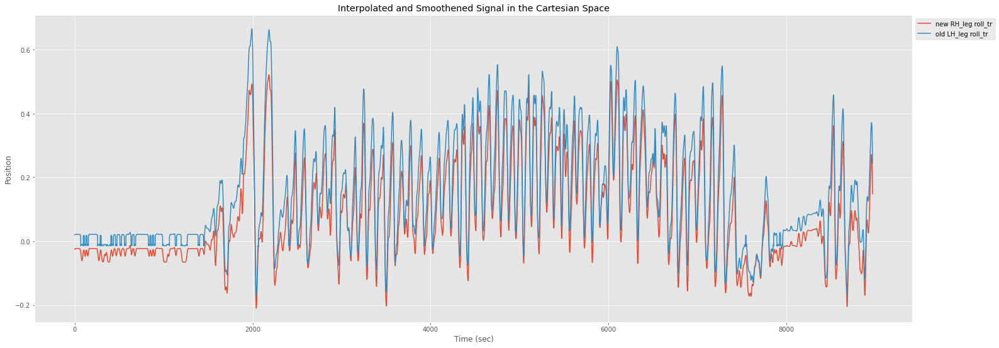

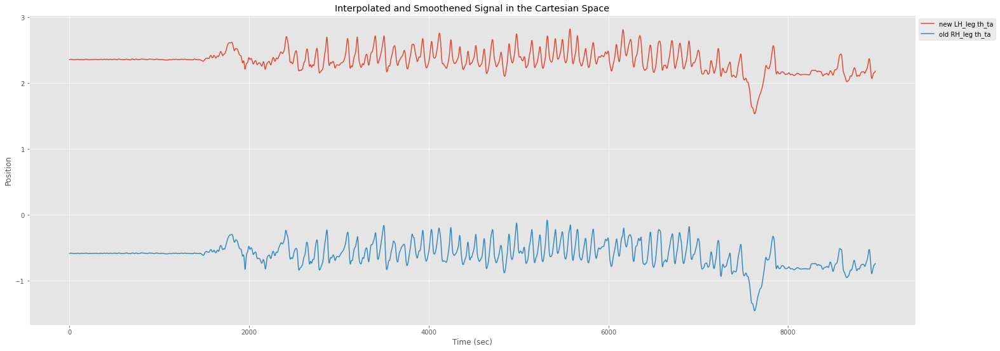

In [12]:
""" Compare interpolated, interpolated+smoothed, and raw pose estimations in Cartesian Space. """
# NOTE: Due to the smoothing, there is an offset of (window_length-1)*0.5 between the non-smoothened and smoothened signal
plt.style.use('ggplot')

for leg in angles.keys():
    for joint in angles[leg].keys():
        plt.figure(figsize=(25,9))
        plt.title('Interpolated and Smoothened Signal in the Cartesian Space')
        plt.plot(angles[leg][joint], label = " ".join(('new',leg,joint)))
        if leg[0]=='L':
            leg = leg.replace('L','R')
            plt.plot(angles_old[leg][joint], label = " ".join(('old',leg,joint)))
        else:
            leg = leg.replace('R','L')
            plt.plot(angles_old[leg][joint], label = " ".join(('old',leg,joint)))
      thwn w
        plt.xlabel('Time (sec)')
        plt.ylabel('Position')
        plt.legend(bbox_to_anchor=(1.0, 1), loc='upper left')
        plt.show()